In [1]:
#install pydicom for reading the dicom data
!pip install pydicom monai spacy nltk sentence_transformers torchvision

In [3]:
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
import nltk, spacy
import sklearn
from sklearn.model_selection import train_test_split
import os
import os.path
import glob
from __future__ import print_function
import sys
from random import shuffle
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt
import time
import os
import copy

import monai
from monai.data import DataLoader, ImageDataset
from monai.transforms import AddChannel, Compose, RandRotate90, Resize, ScaleIntensity, EnsureType

In [21]:
# # Connect to the data which is in Google Drive
# from google.colab import drive

# drive.mount('/content/gdrive')

ModuleNotFoundError: No module named 'google'

In [4]:
data_dir = '../data/'
#train_df = pd.read_pickle(data_dir+'train_img_df.pkl')
#test_df = pd.read_pickle(data_dir+'test_img_df.pkl')
train_csv = pd.read_csv(data_dir + 'trainfiles.csv')
test_csv = pd.read_csv(data_dir + 'testfiles.csv')

#run once at start to rid unneccesary column
train_csv.drop('Unnamed: 0', axis=1, inplace=True)
test_csv.drop('Unnamed: 0', axis=1, inplace=True)


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [5]:
# this function will select the image in the middle of each series of images, so that only a single image from each series is selected for training
# There is one image from each series for each patient
def shorten_df(df, selection_fraction = 0.5):
  df1 = df.copy()
  grouped_df = df.groupby(['patientID', 'series'])
  sorted_df = grouped_df['file_info'].apply(lambda x: x.sort_values())
  
  selected_filename = grouped_df['file_info'].apply(lambda x: x.sort_values().iloc[int(len(x)*selection_fraction)])

  
  selected_filename = selected_filename.reset_index()
  
  # perform merge and deal with duplicate/unnecessary columns
  df1 = df1.merge(selected_filename, on=['patientID', 'series'], how='left') 
  df_short = df1.drop(['file_info_x', 'img_num'], axis=1)
  df_short = df_short.rename(columns = {'file_info_y': 'file_info'})
  df_short.drop_duplicates(inplace=True)
  df_short.reset_index(drop=True, inplace=True)
  return df_short

In [6]:
# create shortened dataframes for train and test
train_csv_short = shorten_df(train_csv, selection_fraction = 0.5)
test_csv_short = shorten_df(test_csv, selection_fraction = 0.5)


In [7]:
#create train, val, and test datasets from the csv files, using same val list as metadata classifier

#using same train/val/test split as in the original split based on the metadata classifier
val_list = [41, 84, 14, 25, 76, 47,62,0,55,63,101,18,81,3,4,95,66]

val_df = train_csv_short[train_csv_short.patientID.isin(val_list)]
train_df = train_csv_short[~train_csv_short.index.isin(val_df.index)]
test_df = test_csv_short


train = train_df.reset_index(drop=True)
val = val_df.reset_index(drop=True)
test = test_df.reset_index(drop=True)

#sanity check
print(len(val)+len(train), len(test))
display(val.head(), train.head())

1766 446


,label,patientID,series,file_info
0,8,41,16(37-72),/volumes/cm7/Abdominal_MRI_dataset_split/train...
1,16,41,18,/volumes/cm7/Abdominal_MRI_dataset_split/train...
2,3,41,11,/volumes/cm7/Abdominal_MRI_dataset_split/train...
3,25,41,7,/volumes/cm7/Abdominal_MRI_dataset_split/train...
4,11,41,6,/volumes/cm7/Abdominal_MRI_dataset_split/train...


,label,patientID,series,file_info
0,8,104,18(35-68),/volumes/cm7/Abdominal_MRI_dataset_split/train...
1,8,104,18(1-34),/volumes/cm7/Abdominal_MRI_dataset_split/train...
2,16,104,20,/volumes/cm7/Abdominal_MRI_dataset_split/train...
3,9,104,9,/volumes/cm7/Abdominal_MRI_dataset_split/train...
4,9,104,11,/volumes/cm7/Abdominal_MRI_dataset_split/train...


In [8]:
test_df_for_labels = pd.read_pickle('../data/X_test02282023.pkl')
train_df_for_labels = pd.read_pickle('../data/X_train02282023.pkl')


In [9]:
test_df_for_labels.columns

Index(['fname_x', 'StudyInstanceUID', 'SeriesInstanceUID', 'SeriesNumber',
       'SeriesDescription_x', 'AcquisitionNumber', 'InstanceNumber',
       'ImageOrientationPatient', 'MRAcquisitionType', 'AngioFlag',
       ...
       'GT plane', 'GT contrast', 'original_label_code', 'con_label_code',
       'MB_label_code', 'prob_avg', 'pixel_label_code', 'textual_label_code',
       'ap_label_code', 'pixel_ap_label_code'],
      dtype='object', length=144)

In [10]:
X_train = train_df_for_labels.SeriesDescription_x
y_train = train_df_for_labels.ap_label_code

X_test = test_df_for_labels.SeriesDescription_x
y_test = test_df_for_labels.ap_label_code


In [11]:
## sentence transformer model for sentiment classification
sentence_encoder = 'all-MiniLM-L6-v2' 
senttrans_model = SentenceTransformer(sentence_encoder, device=device)


2023-03-28 12:00:25,172 - Load pretrained SentenceTransformer: all-MiniLM-L6-v2


In [12]:
X_train

0         ax diff_TRACEW
1         ax diff_TRACEW
2         ax equilibrium
3            ax haste bh
4       ax t2 triggerred
              ...       
1729           cor haste
1730              ax dyn
1731              ax dyn
1732        ax dixon_opp
1733              ax dyn
Name: SeriesDescription_x, Length: 1734, dtype: object

In [13]:
X_test

0            ax diff_TRACEW
1            ax diff_TRACEW
2        ax equilibrium new
3                ax dyn new
4                ax dixon_W
               ...         
427          ax diff_TRACEW
428               cor haste
429              ax dyn new
430             ax dixon_in
431    ax portal venous new
Name: SeriesDescription_x, Length: 432, dtype: object

In [14]:
X_train_encoded = [senttrans_model.encode(doc) for doc in X_train.to_list()]
X_train_encoded

Batches: 100%|██████████| 1/1 [00:00<00:00, 66.60it/s]


[array([-8.16702619e-02, -4.77806106e-02, -2.80628894e-02, -7.22320750e-03,
         5.09094819e-02, -1.22262791e-01,  1.20385222e-01,  1.33574847e-02,
        -3.94254252e-02,  3.29487324e-02,  1.14851937e-01, -3.91167291e-02,
        -4.65270840e-02, -2.76851691e-02, -9.71687213e-02,  3.85102741e-02,
        -1.44224390e-01, -1.95629913e-02, -6.93079904e-02,  5.66454139e-03,
         9.64136794e-03,  2.84498055e-02, -6.02574982e-02, -3.75402905e-03,
         3.16859819e-02,  4.68408018e-02,  3.52462120e-02,  1.19214162e-01,
         7.39519373e-02, -1.06857635e-01,  4.90381904e-02,  9.83241796e-02,
        -1.27246045e-02,  1.50170634e-02, -1.19556219e-03, -1.37856025e-02,
         4.99211885e-02,  3.43537107e-02,  2.05649622e-02,  1.56251364e-03,
         7.16490000e-02,  9.55479592e-02,  6.89143240e-02, -4.42910893e-03,
        -2.09219847e-02, -4.12122682e-02, -2.18643830e-03,  3.43705751e-02,
         4.17143665e-02,  5.73839918e-02,  2.82557216e-02, -8.12926702e-03,
        -2.0

In [15]:
X_test_encoded = [senttrans_model.encode(doc) for doc in X_test.to_list()]
X_test_encoded

Batches: 100%|██████████| 1/1 [00:00<00:00, 65.54it/s]


[array([-8.16702619e-02, -4.77806106e-02, -2.80628894e-02, -7.22320750e-03,
         5.09094819e-02, -1.22262791e-01,  1.20385222e-01,  1.33574847e-02,
        -3.94254252e-02,  3.29487324e-02,  1.14851937e-01, -3.91167291e-02,
        -4.65270840e-02, -2.76851691e-02, -9.71687213e-02,  3.85102741e-02,
        -1.44224390e-01, -1.95629913e-02, -6.93079904e-02,  5.66454139e-03,
         9.64136794e-03,  2.84498055e-02, -6.02574982e-02, -3.75402905e-03,
         3.16859819e-02,  4.68408018e-02,  3.52462120e-02,  1.19214162e-01,
         7.39519373e-02, -1.06857635e-01,  4.90381904e-02,  9.83241796e-02,
        -1.27246045e-02,  1.50170634e-02, -1.19556219e-03, -1.37856025e-02,
         4.99211885e-02,  3.43537107e-02,  2.05649622e-02,  1.56251364e-03,
         7.16490000e-02,  9.55479592e-02,  6.89143240e-02, -4.42910893e-03,
        -2.09219847e-02, -4.12122682e-02, -2.18643830e-03,  3.43705751e-02,
         4.17143665e-02,  5.73839918e-02,  2.82557216e-02, -8.12926702e-03,
        -2.0

Accuracy on the training set is 0.956
Accuracy on the test set is 0.965


<Figure size 2500x2500 with 0 Axes>

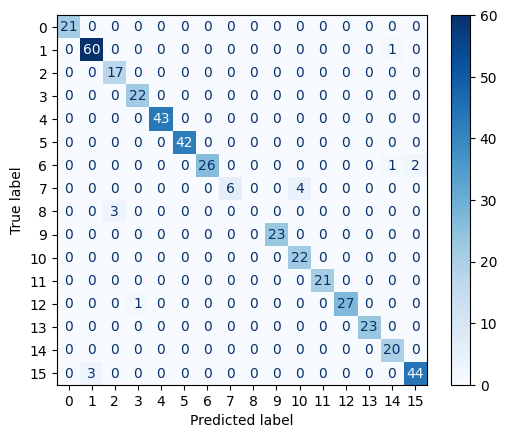

In [16]:
# Train a classification model using logistic regression classifier
logreg_model = LogisticRegression(solver='saga')
logreg_model.fit(X_train_encoded, y_train)
preds = logreg_model.predict(X_train_encoded)
acc = sum(preds == y_train) / len(y_train)
print('Accuracy on the training set is {:.3f}'.format(acc))

## assess on the test set
preds_test = logreg_model.predict(X_test_encoded)
acc_test = sum(preds_test == y_test) / len(y_test)

## display results on test set
print('Accuracy on the test set is {:.3f}'.format(acc_test))

cm = confusion_matrix(y_test, preds_test)
plt.figure(figsize=(25, 25))
plt.tight_layout()
ConfusionMatrixDisplay(cm).plot(cmap='Blues')
#plt.savefig("./assets/images/ConfusionMatrixSentences" + datetime.now().strftime('%Y%m%d') + ".png", dpi=300,
               # bbox_inches='tight')

plt.show()

In [19]:
test_probs_list = [max(x) for x in test_probs]


0.2533092349303466

In [20]:
low_probs_list = [x for x in test_probs_list if x<0.5]
low_probs_list

[0.3166098947073651,
 0.39264369360605655,
 0.2533092349303466,
 0.38395842424376403,
 0.386821330559404,
 0.43464136993362007,
 0.484660765377975,
 0.4812044555913425,
 0.3660074503781157,
 0.3687249340222232,
 0.4584618848949487,
 0.34316354735732246,
 0.3741412168563472,
 0.4846607653779746,
 0.36872493402222317,
 0.4812044555913426,
 0.4812044555913426,
 0.4812044555913426,
 0.36872493402222317,
 0.36872493402222317,
 0.4846607653779746,
 0.4846607653779746,
 0.4584618848949487]